# 8. Final project

Notebook to recognize and categorize taps in an image


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imutils

First, load the dataset:
We see there are:
* 1 tap  rounded black
* 1 tap  rounded white
* 3 taps rounded blue
* 2 taps rounded red
* 2 taps squared red
* 1 tap  squared yellow
* 1 tap  elliptical pink

Given all these, in some pictures maybe some of there are not include. 
We assume this taps have always same size.




**Steps:**

1. Load image
2. Convert to RGB
3. Crop image
4. Convert to gray scale
5. Plot different channels / transformations of the image
6. Filters/Masks
7. Postprocessing
8. Sum all masks
9. Find and represent Contours
10. Draw the center of the objects and  color

**_NOTE:_** steps 2, 3, 4 and 5 can be considered as preprocessing.

**_NOTE 2:_** This document is for educational purposes, of course the code can be optimized. It is intended to give people a simple intuition about how to approach a project like this.

## 8.1  Load image

In [2]:
image = cv2.imread('final_project_imgs/5.jpg')

## 8.2 Convert (BGR) image to RGB

In [3]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

## 8.3 Crop image

We crop the image as there is too much backround above and below ROI. These parts of the background (top and bottom) are affected by the light (lighter), so cropping the images we assure a better change to detect lighter objects.

In [4]:
# Create a copy of original image
image_copy = image.copy()

# crop image
print(image_copy.shape) #(4000, 3000, 3)
image_copy = image_copy[500:3300, :]
print(image_copy.shape) #(2800, 3000, 3)

# Copies of image cropped

image_original = image_copy.copy()
image_original_final_mask = image_copy.copy()
image_template = image_copy.copy()
image_test = image_copy.copy()
image_test2 = image_copy.copy()

(4000, 3000, 3)
(2800, 3000, 3)


## 8.4 Convert image to gray scale

In [5]:
gray = cv2.cvtColor(image_copy, cv2.COLOR_BGR2GRAY)

## 8.5 Plot different channels / transformations of the image

It is a good practice to  check some transformations in order to check if they can be used to make objects more "visibles".

We will apply a bilateral filter: like gaussian, but transform only pixels with same intensity values. Because of that, is highly effective in noise removal while keeping edges sharp.

Also, we will plot all differente channels, including; R,G,B and also H,S,V.


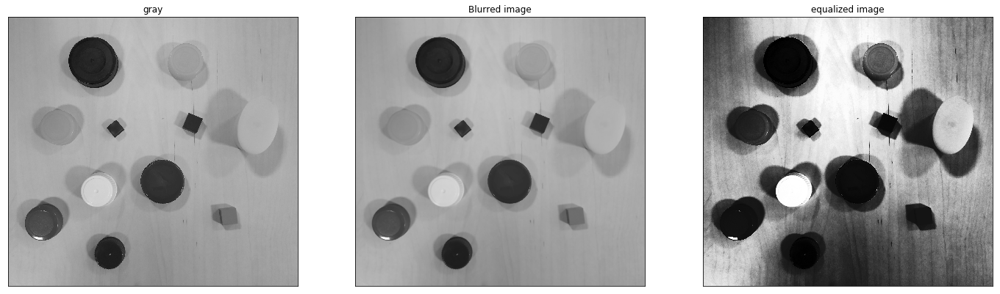

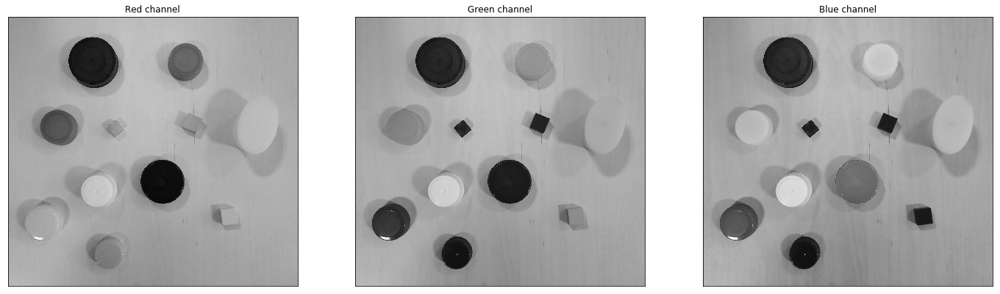

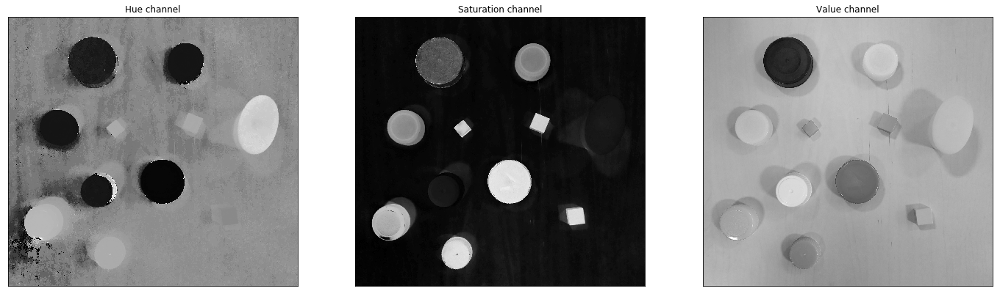

In [6]:
# REPRESENT GRAYSCALE, BLURRED, EQUALIZED

blurred = cv2.bilateralFilter(gray, 15, 75, 75)
equal_image = cv2.equalizeHist(gray)

fig, axes = plt.subplots(1, 3, figsize=(24,12))
axes[0].imshow(gray, cmap='gray',  vmin=0, vmax=255)
axes[0].set_title('gray')
axes[1].imshow(blurred, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Blurred image')
axes[2].imshow(equal_image, cmap='gray',  vmin=0, vmax=255)
axes[2].set_title('equalized image')
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])


# REPRESENT R,G,B
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
axes[0].imshow(image_test[:, :, 0],cmap='gray')
axes[0].set_title('Red channel')
axes[1].imshow(image_test[:, :, 1], cmap='gray')
axes[1].set_title('Green channel')
axes[2].imshow(image_test[:, :, 2],cmap='gray')
axes[2].set_title('Blue channel')
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

    
# REPRESENT H,S,V       
hsv = cv2.cvtColor(image_test, cv2.COLOR_BGR2HSV)
hue = hsv [:,:,0]         # Hue Channel    
saturation = hsv[:, :, 1] # Saturation Channel
value = hsv[:, :, 2]      # Value Channel

fig, axes = plt.subplots(1,3, figsize=(24, 12))
axes[0].imshow(hsv[:, :, 0], cmap='gray')
axes[0].set_title('Hue channel')
axes[1].imshow(hsv[:, :, 1], cmap='gray')
axes[1].set_title('Saturation channel')
axes[2].imshow(hsv[:, :, 2], cmap='gray')
axes[2].set_title('Value channel')
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

## 8.6 Filters/Masks

Now that we have preprocess the image, we can apply filters/masks to it.

It is important to note that a mask is just a binary value matrix. That being said, you can add up various mask in result of a final mask. This is the method we will use to recognize all different objects.

We will make 3 `inrange` filters:

* Hue channel for pink tap.
* Blurred image for white tap.
* Blurred image for a lot of the taps.
* Saturation channel for rest of the taps (confluence with last filter).

### 8.6.1 Hue channel mask

We will apply an `inrange` filter in hue channel.

Also we will erode the mask and then dilate it to eliminate noise.

As it is visible, we have our ROI (pink tap) in  `erosion_dilation_hue`. Later on, we will sum up this mask to the others.

Text(0.5, 1.0, 'erosion + dilation')

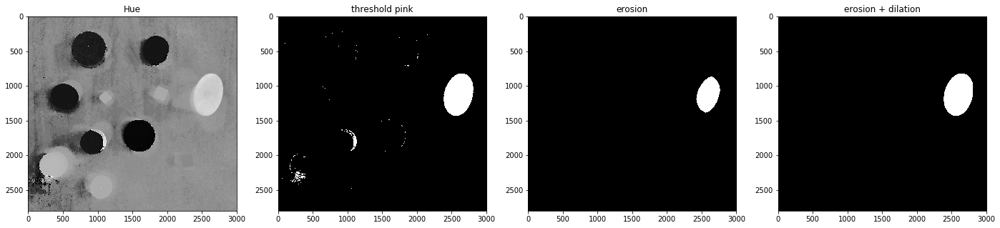

In [7]:
th_pink = cv2.inRange(hue,130,255)

kernel = np.ones((5,5),np.float32)/225
erosion_hue = cv2.erode(th_pink, kernel, iterations = 20)
erosion_dilation_hue = cv2.dilate(erosion_hue, kernel, iterations = 20)


fig, axes = plt.subplots(1, 4, figsize=(24,12))
axes[0].imshow(hue, cmap='gray')
axes[0].set_title('Hue')
axes[1].imshow(th_pink, cmap='gray')
axes[1].set_title('threshold pink')

axes[2].imshow(erosion_hue, cmap='gray')
axes[2].set_title('erosion')
axes[3].imshow(erosion_dilation_hue, cmap='gray')
axes[3].set_title('erosion + dilation')

### 8.6.2 Saturation channel mask

We will apply an `inrange` filter in blurred image

Also we will erode the mask and then dilate it to eliminate noise.

As it is visible, we have our ROI (various tap) in  `erosion_dilation_hue`. Later on, we will sum up this mask to the others.

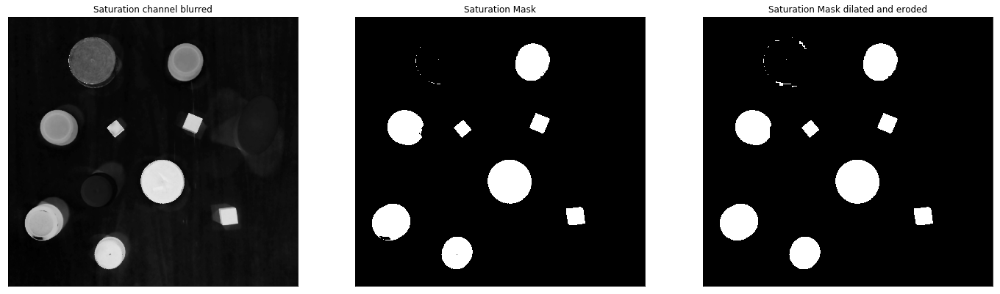

In [8]:
blurred_saturation = cv2.bilateralFilter(saturation, 15, 75, 75)
th_saturation = cv2.inRange(blurred_saturation, 110,255)
# 0-70, 200-255


dilation_saturation = cv2.dilate(th_saturation, kernel, iterations = 20)
th_saturation_dilated = cv2.erode(dilation_saturation, kernel, iterations = 20)



fig, axes = plt.subplots(1, 3, figsize=(24,12))
axes[0].imshow(blurred_saturation, cmap='gray',  vmin=0, vmax=255)
axes[0].set_title('Saturation channel blurred')
axes[1].imshow(th_saturation, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Saturation Mask')
axes[2].imshow(th_saturation_dilated, cmap='gray', vmin=0, vmax=255)
axes[2].set_title('Saturation Mask dilated and eroded')

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

### 8.6.3 Blurred image Masks

This it is composed by two different mask, one for blue/red taps and other for the white tap.

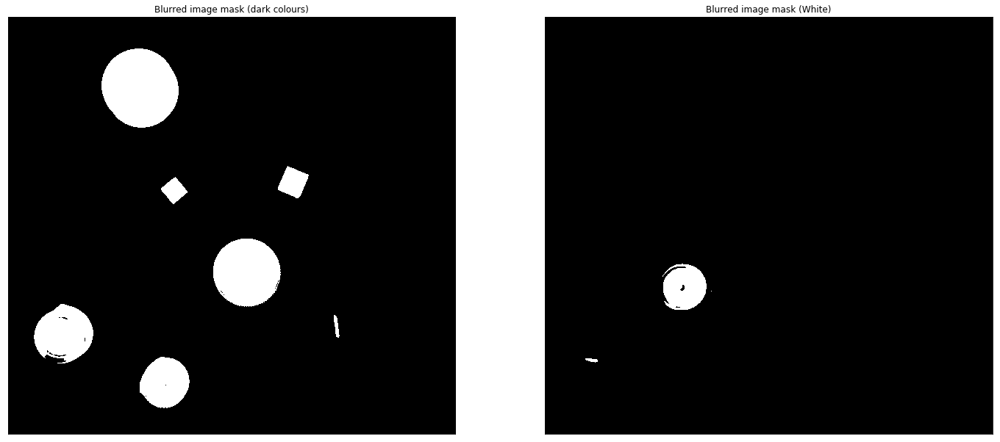

In [9]:
#Thresholds

th_inrange = cv2.inRange(blurred, 0, 90)
th_inrange_white = cv2.inRange(blurred, 205, 255)


fig, axes = plt.subplots(1, 2, figsize=(24,12))
axes[0].imshow(th_inrange, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Blurred image mask (dark colours)')
axes[1].imshow(th_inrange_white, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Blurred image mask (White)')
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])


### 8.7 Mask Postprocessing

Now that we have this two filters, it is time to apply some postprocessing to kill noise in the filters.

[]

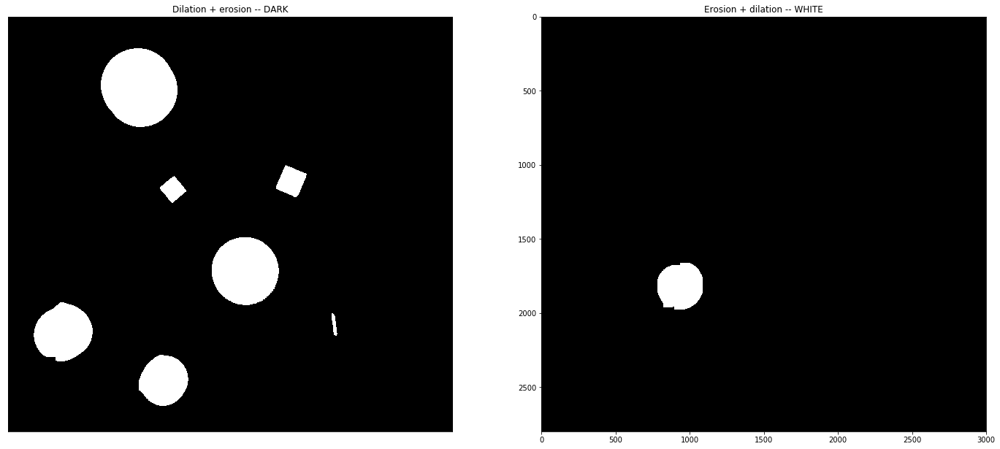

In [10]:
# Note that we can use different kernels if needed
kernel = np.ones((5,5),np.float32)/225

# Erosion + dilation -- White tap
erosion_white = cv2.erode(th_inrange_white, kernel, iterations = 10)
erosion_dilation_white = cv2.dilate(erosion_white, kernel, iterations = 15)

# Dilation + erosion -- Dark taps
dilation_dark = cv2.dilate(th_inrange, kernel, iterations = 20)
dilation_erosion_dark = cv2.erode(dilation_dark, kernel, iterations = 20)

fig, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].imshow(dilation_erosion_dark, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Dilation + erosion -- DARK')
axes[1].imshow(erosion_dilation_white, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Erosion + dilation -- WHITE')
axes[0].set_xticks([])
axes[0].set_yticks([])

## 8.8 Sum all masks

In [11]:
final_mask = erosion_dilation_hue + erosion_dilation_white + dilation_erosion_dark + th_saturation_dilated

Next is to plot all filters, including the `final_mask`

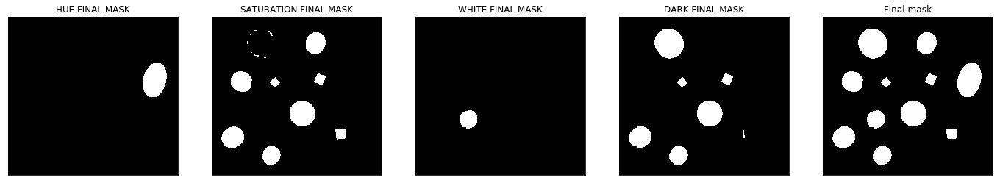

In [12]:
fig, axes = plt.subplots(1, 5, figsize=(24,12))
axes[0].imshow(erosion_dilation_hue, cmap='gray',  vmin=0, vmax=255)
axes[0].set_title('HUE FINAL MASK')
axes[1].imshow(th_saturation_dilated, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('SATURATION FINAL MASK')
axes[2].imshow(erosion_dilation_white, cmap='gray')
axes[2].set_title('WHITE FINAL MASK')
axes[3].imshow(dilation_erosion_dark, cmap='gray', vmin=0, vmax=255)
axes[3].set_title('DARK FINAL MASK')
axes[4].imshow(final_mask, cmap='gray', vmin=0, vmax=255)
axes[4].set_title('Final mask')

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

## 8.9 Find contours and draw them in original image

Text(0.5, 1.0, 'Original image contoured')

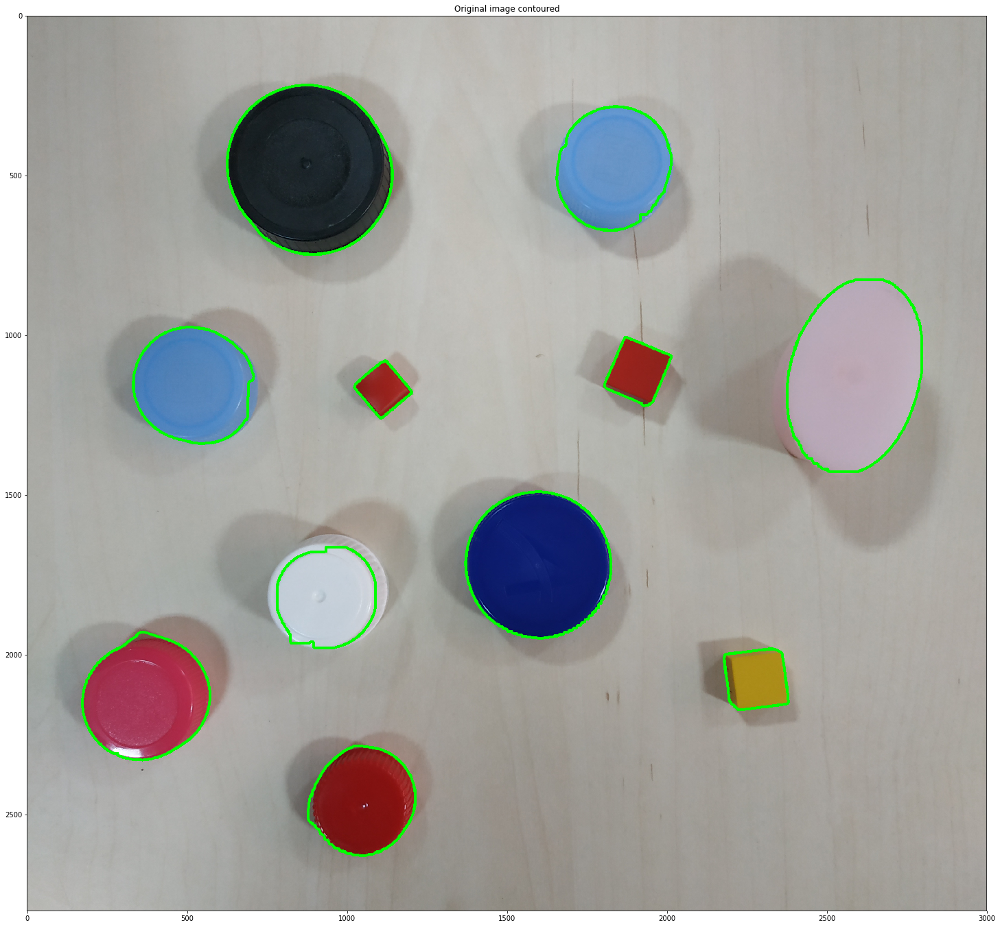

In [13]:
# Find contours in the thresholded image
cnts = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Grab the appropriate tuple value based on whether 
# we are using OpenCV 2.4, 3, or 4.
cnts = imutils.grab_contours(cnts)

# (image,contours,number of contours (-1 = all),color to draw, width (-1 =filled)
cv2.drawContours(image_copy, cnts, -1, (0, 255, 0), 8)

# show thresholded image
fig, axes = plt.subplots(1, 1, figsize=(48, 24))
axes.imshow(image_copy, cmap='gray', vmin=0, vmax=255)
axes.set_title('Original image contoured')

## 8.9.1  Filter contours by area

We see there are a lot of contours when we just want one, the white one. So now, we filter by area to reduce contours to just the desires.


**_NOTE:_** Regarding to areas, it is always better to talk about percentages (*e.g: if ROI is 15% of total image pixels, then delete contour if its area is belo 10% of the image.*). This way, you make sure that if the input image changes size or quality, the area is going to be OK. Here this is not performed, so be careful with area sizes.

Area of contour:  86428.5
Area of contour:  31902.0
Area of contour:  118814.0
Area of contour:  78635.5
Area of contour:  162682.5
Area of contour:  17473.0
Area of contour:  27617.0
Area of contour:  106693.5
Area of contour:  199085.0
Area of contour:  107357.5
Area of contour:  211525.0

 Number of contours found:  11


Text(0.5, 1.0, 'Original image contoured')

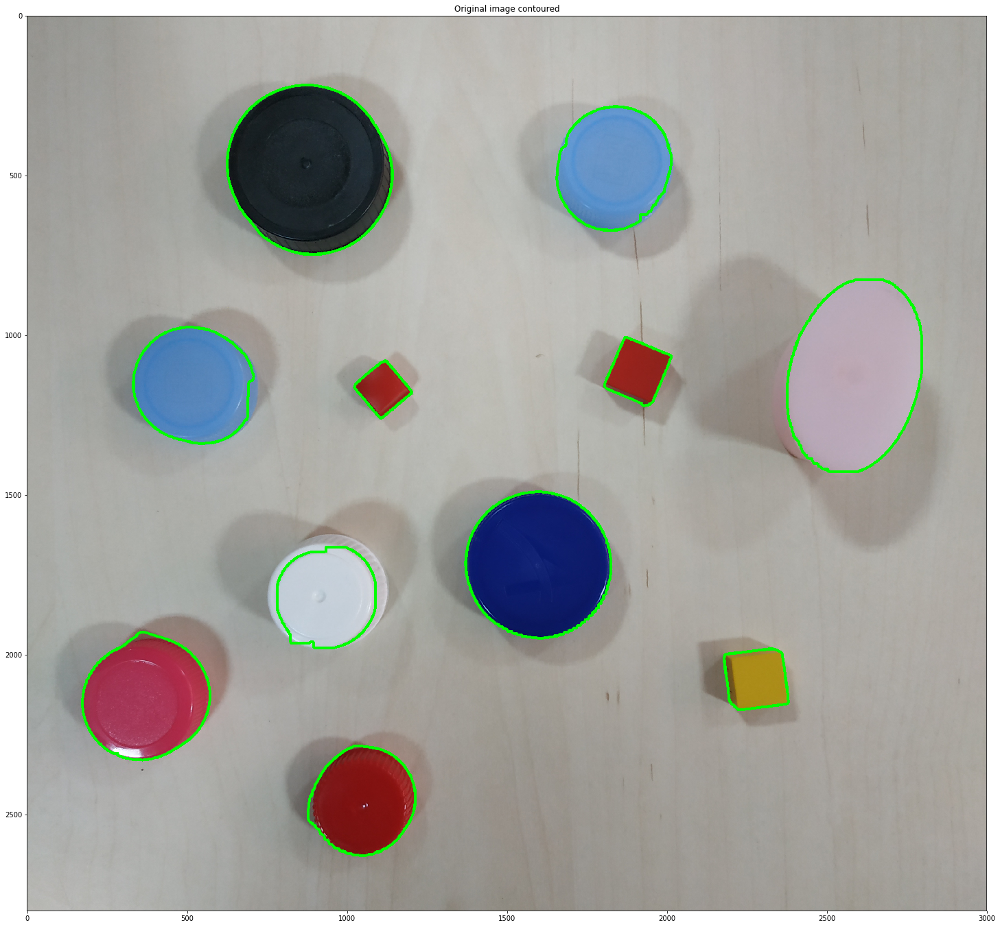

In [14]:
for contour in cnts:
        area = cv2.contourArea(contour)
        print("Area of contour: ",area)

def clean_contours_by_area(contours, min_size, max_size, min_circularity):
    """filter all contours by size to prevent noise"""
    filtred_contours  = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if (area < max_size) & (area > min_size):
            perimeter = cv2.arcLength(contour, True)
            filtred_contours.append(contour)
    return filtred_contours

cnts_filtred = clean_contours_by_area(cnts,15000,1000000,0.5)
cv2.drawContours(image_original, cnts_filtred, -1, (0, 255, 0), 8)

print('\n Number of contours found: ',len(cnts_filtred))


# show image
fig, axes = plt.subplots(1, 1, figsize=(48, 24))
axes.imshow(image_original, cmap='gray', vmin=0, vmax=255)
axes.set_title('Original image contoured')

Now it is time to sum the various mask in order to get all ROIS in the same mask.

Text(0.5, 1.0, 'Original image contoured')

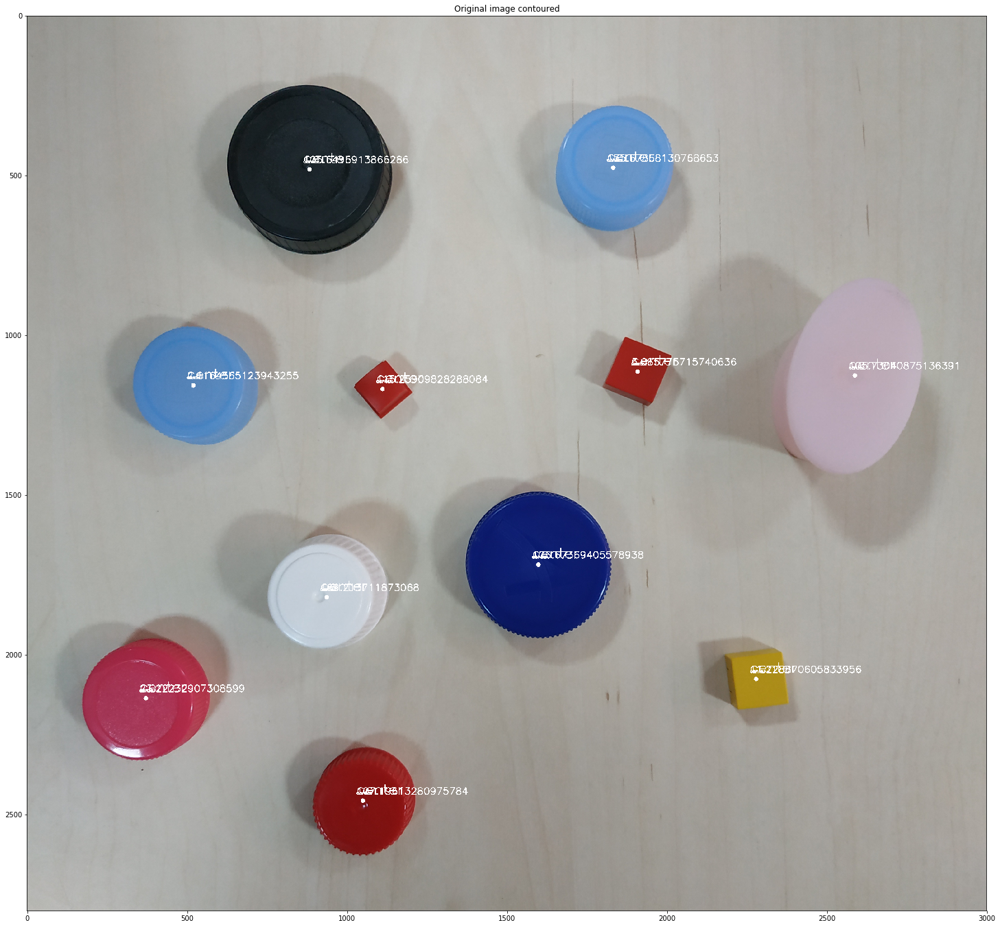

## 8.10 Draw the center of the objects and  color

Text(0.5, 1.0, 'Final Image')

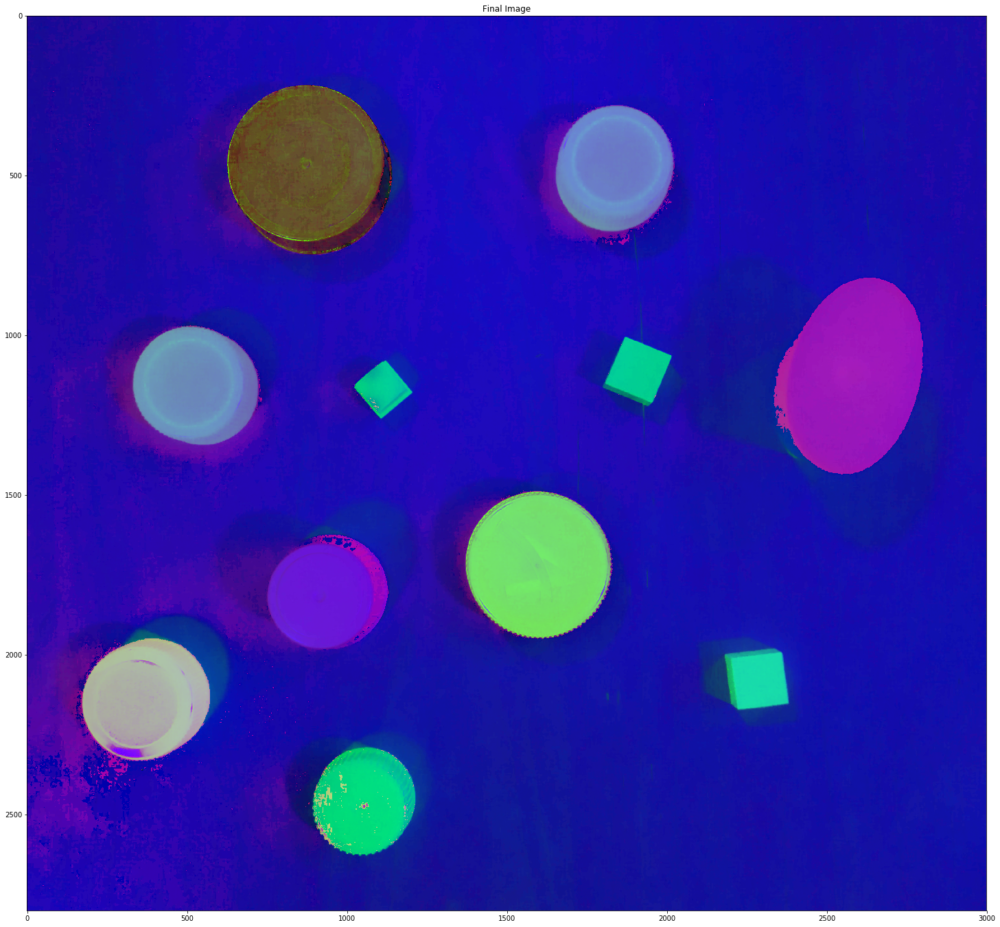

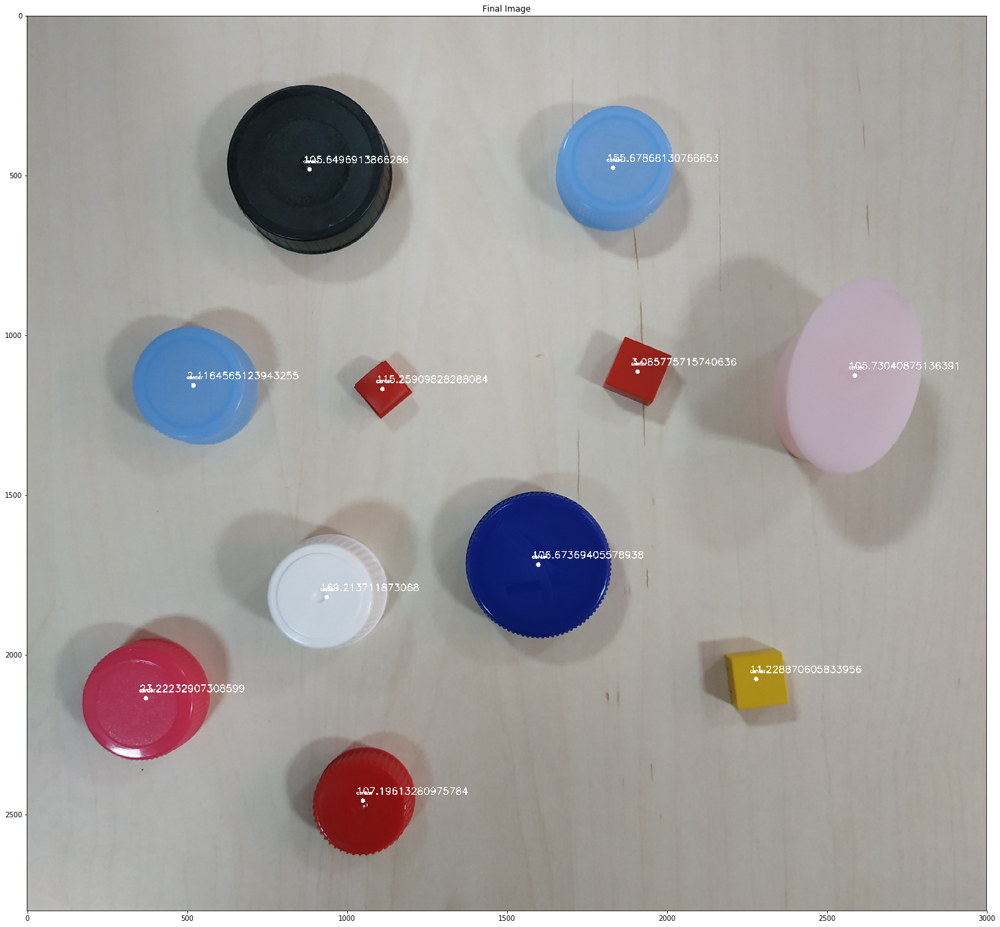

In [16]:
image_hsv = cv2.cvtColor(image_test2, cv2.COLOR_RGB2HSV)


fig, axes = plt.subplots(1, 1, figsize=(48, 24))
axes.imshow(image_hsv, cmap='gray', vmin=0, vmax=255)
axes.set_title('Final Image')

i = 0
for cnt in cnts_filtred:
    
    
   
    final = np.zeros((image_hsv.shape[0],image_hsv.shape[1]), dtype=np.uint8) 

    # Find contours in the thresholded image
    cnts = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Grab the appropriate tuple value based on whether 
    # we are using OpenCV 2.4, 3, or 4.
    cnts = imutils.grab_contours(cnts)


    # dibujar los contornos en fondo negro y rellenarlos (-1 = pintar todos, -1 = filled, rellenarlos)
    #NOTA: PUEDO PINTAR 1,2,3.. ESTO ME PINTA SOLO UNO, ASI QUE EN BLUCLE SERIA i=1,2,3.. len(cnts)
    cv2.drawContours(final, cnts_filtred, i-1, (255, 255, 255), -1)

    # fig, axes = plt.subplots(1, 1, figsize=(48, 24))
    # axes.imshow(final, cmap='gray', vmin=0, vmax=255)
    # axes.set_title('Mask contoured')
    mean_v = cv2.mean(image_hsv,mask = final)
    #print(mean_v)
    
    if (110 < mean_v[0] < 130):
        color = "red"
    elif (130 <= mean_v[0] < 150):
        color = "blue"
    elif (0 < mean_v[0] <=10):
        color = "white"
    else:
        color = "pink"
    # compute the center of the contour
    M = cv2.moments(cnt)
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])

    # draw the contour and center of the shape on the image
    cv2.circle(image_original_final_mask, (cX, cY), 7, (255, 255, 255), -1)
    cv2.putText(image_original_final_mask, str(mean_v[0]), (cX - 20, cY - 20), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)# str(color)

    i = i + 1 
fig, axes = plt.subplots(1, 1, figsize=(48, 24))
axes.imshow(image_original_final_mask, cmap='gray', vmin=0, vmax=255)
axes.set_title('Final Image')
